# Simulation study - Inference of tumour growth model from a group of virtual patients without treatment

We fix all parameters but one, which we sample from a log-normal distribution.

In [1]:
import arviz as az
import erlotinib as erlo
import matplotlib.pyplot as plt
import numpy as np
import pints

## Build tumour growth model

In [2]:
# Define mechanistic model
path = erlo.ModelLibrary().tumour_growth_inhibition_model_koch_reparametrised()
mechanistic_model = erlo.PharmacodynamicModel(path)
mechanistic_model.set_parameter_names(names={
    'myokit.tumour_volume': 'Tumour volume in cm^3',
    'myokit.critical_volume': 'Critical volume in cm^3',
    'myokit.drug_concentration': 'Drug concentration in mg/L',
    'myokit.kappa': 'Potency in L/mg/day',
    'myokit.lambda': 'Exponential growth rate in 1/day'})
mechanistic_model.set_output_names(names={
    'myokit.tumour_volume': 'Tumour volume in cm^3'})

# Define error model
error_model = erlo.ConstantAndMultiplicativeGaussianErrorModel()

# Define population model
population_model = [
    erlo.LogNormalModel()]  # Tumour growth rate

# Build model
problem = erlo.ProblemModellingController(
    mechanistic_model, error_model)
problem.fix_parameters({
    'Tumour volume in cm^3': 0.13,
    'Critical volume in cm^3': 1,
    'Drug concentration in mg/L': 0,
    'Potency in L/mg/day': 0,
    'Sigma base': 0.04,
    'Sigma rel.': 0.1})
problem.set_population_model(population_model)

## Measure tumour volume in a virtual patient

In [3]:
# Get predictive model
predictive_model = problem.get_predictive_model()

# Define a virtual patient population
parameters = [
    0.25,  # Mean: Tumour growth rate
    0.15]  # Std.: Tumour growth rate

# Take virtual measurements
seed = 1
times = np.linspace(0, 30, num=10)
n_samples = 8
data = predictive_model.sample(parameters, times, n_samples, seed)

# Create scatter plot
fig = erlo.plots.PDTimeSeriesPlot()
fig.add_data(data, biomarker='Tumour volume in cm^3', meas_key='Sample')
fig.set_axis_labels(xlabel=r'$\text{Time in day}$', ylabel=r'$\text{Tumour volume in cm}^3$')

# Show figure
fig.show()

**Figure 1:** Visualisation of the measured tumour growth in a group of virtual patient.

## Build prior predictive model

### Population model

In [16]:
# Define prior distribution
log_priors = [
    pints.TruncatedGaussianLogPrior(mean=0.3, sd=0.1, a=0, b=np.inf),      # Mean Growth rate
    pints.TruncatedGaussianLogPrior(mean=0.8, sd=0.2, a=0, b=np.inf)]    # Std. Growth rate
log_prior = pints.ComposedLogPrior(*log_priors)

# Define prior predictive model
predictive_model = problem.get_predictive_model()
model = erlo.PriorPredictiveModel(predictive_model, log_prior)

# Sample from prior predictive model
seed = 42
n_samples = 100
times = np.linspace(0, 30)
samples = model.sample(times, n_samples, seed)

# Visualise prior predictive model
fig = erlo.plots.PDPredictivePlot()
fig.add_prediction(data=samples, bulk_probs=[0.3, 0.6, 0.9])
fig.set_axis_labels(xlabel=r'$\text{Time in day}$', ylabel=r'$\text{Tumour volume in cm}^3$')
fig.show()

In [24]:
pints.TruncatedGaussianLogPrior(mean=0.3, sd=0.1, a=0, b=np.inf).evaluateS1([0.0001])

(-3.1120031302458773, array([29.99]))

**Figure 3:** Approximate prior predictive model for the tumour growth in a population over time. The shaded areas indicate the 30%, 60% and 90% bulk of the prior predictive model (from dark to light). The prior predictive model was approximated by sampling 1000 parameters from the prior distribution, and subsequent sampling of 50 equidistant time points from the predictive model for each parameter set.

## Find posterior probability distribution

In [28]:
# Get log-posterior
problem.set_data(data, meas_key='Sample')
problem.set_log_prior(log_priors)
log_posterior = problem.get_log_posterior()

# Set up sampling controller
sampler = erlo.SamplingController(log_posterior)
sampler.set_sampler(pints.HamiltonianMCMC)
transform = pints.ComposedTransformation(
    pints.LogTransformation(8),
    pints.IdentityTransformation(2))
sampler.set_transform(transform=transform)
sampler.set_n_runs(5)

# Run sampling
n_iterations = 1000
hyperparameters = [
    10,                                                  # Number of steps
    [0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.1, 0.15]]  # Step sizes
posterior_samples = sampler.run(
    n_iterations=n_iterations, hyperparameters=hyperparameters, show_progress_bar=True)

### Visualise posterior samples

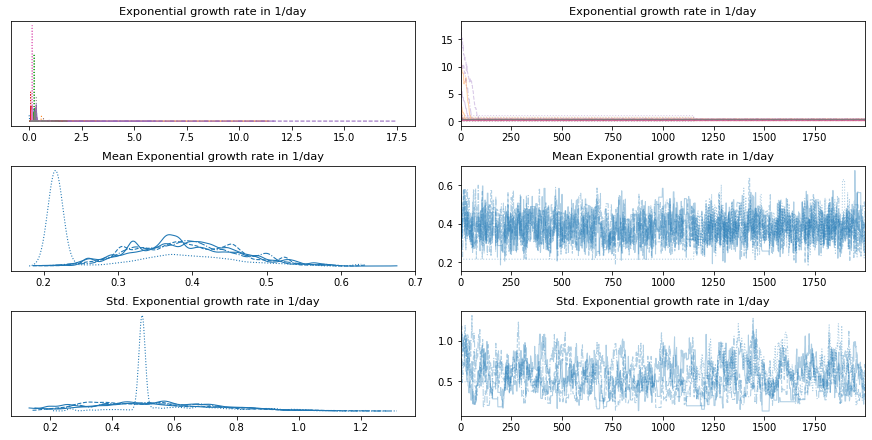

In [29]:
az.plot_trace(posterior_samples)
plt.show()

In [30]:
posterior_samples.attrs['divergent iterations']

[array([], dtype=int64),
 array([], dtype=int64),
 array([], dtype=int64),
 array([], dtype=int64),
 array([], dtype=int64)]

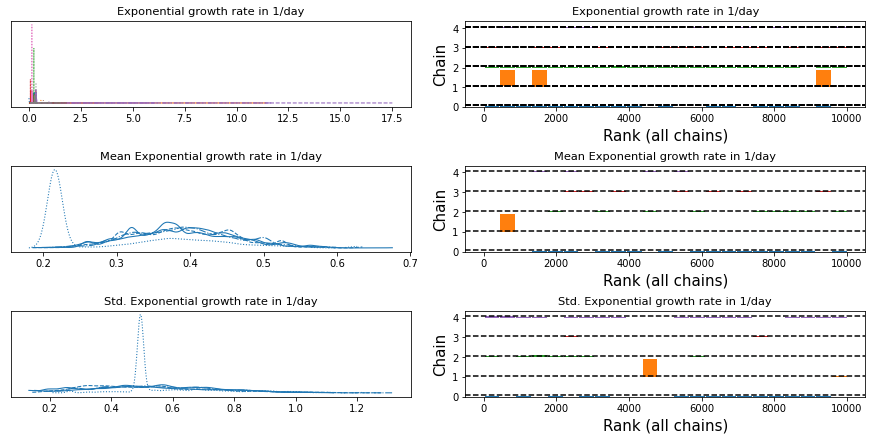

In [31]:
az.plot_trace(posterior_samples, kind='rank_bars')
plt.show()

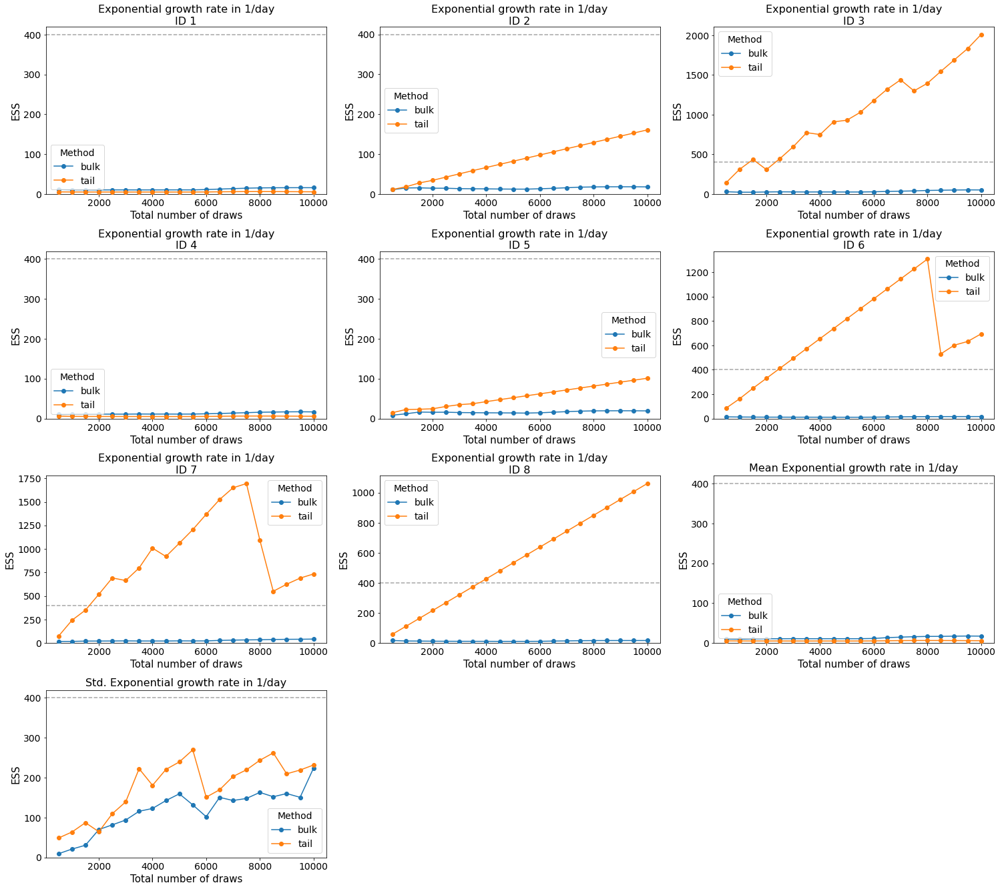

In [32]:
az.plot_ess(posterior_samples, kind="evolution")
plt.show()

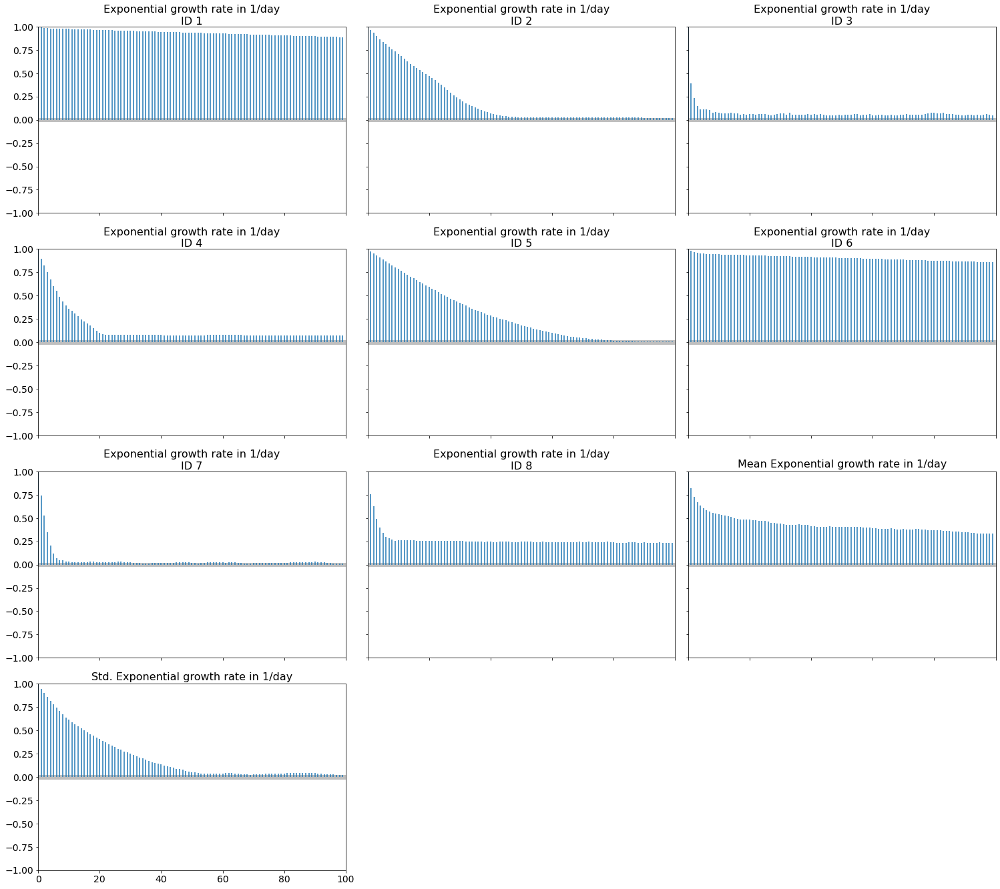

In [33]:
az.plot_autocorr(posterior_samples, combined=True)
plt.show()

### Exclude warmup

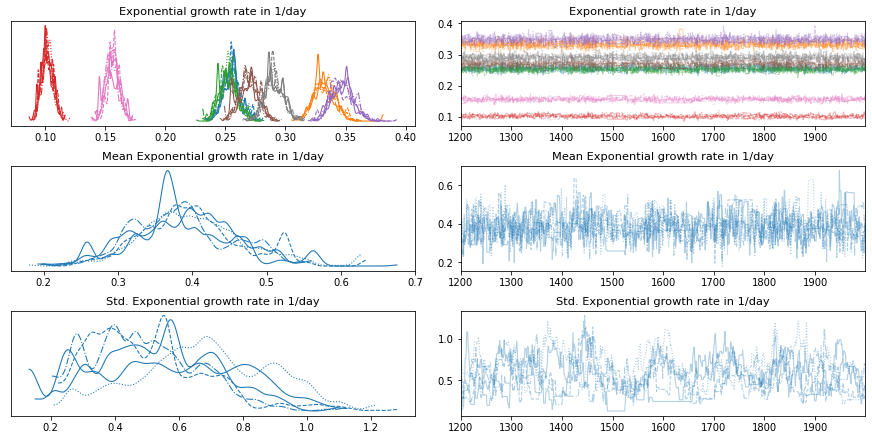

In [35]:
warmup = 1200

az.plot_trace(posterior_samples.sel(draw=slice(warmup, n_iterations)))
plt.show()

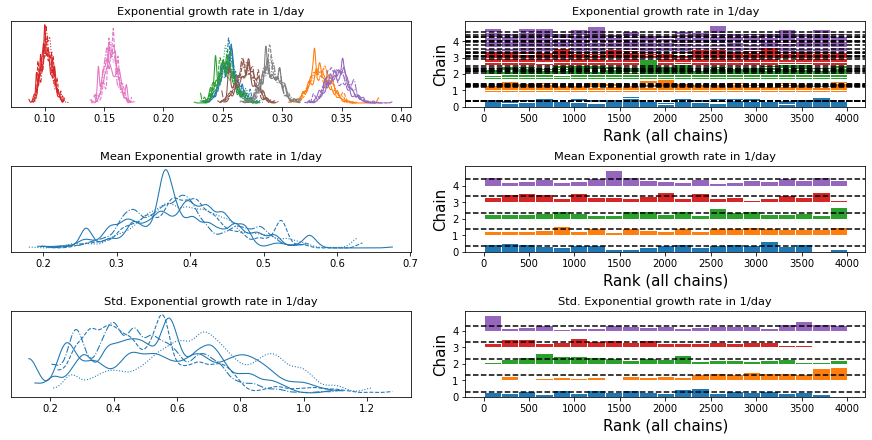

In [36]:
az.plot_trace(posterior_samples.sel(draw=slice(warmup, n_iterations)), kind='rank_bars')
plt.show()

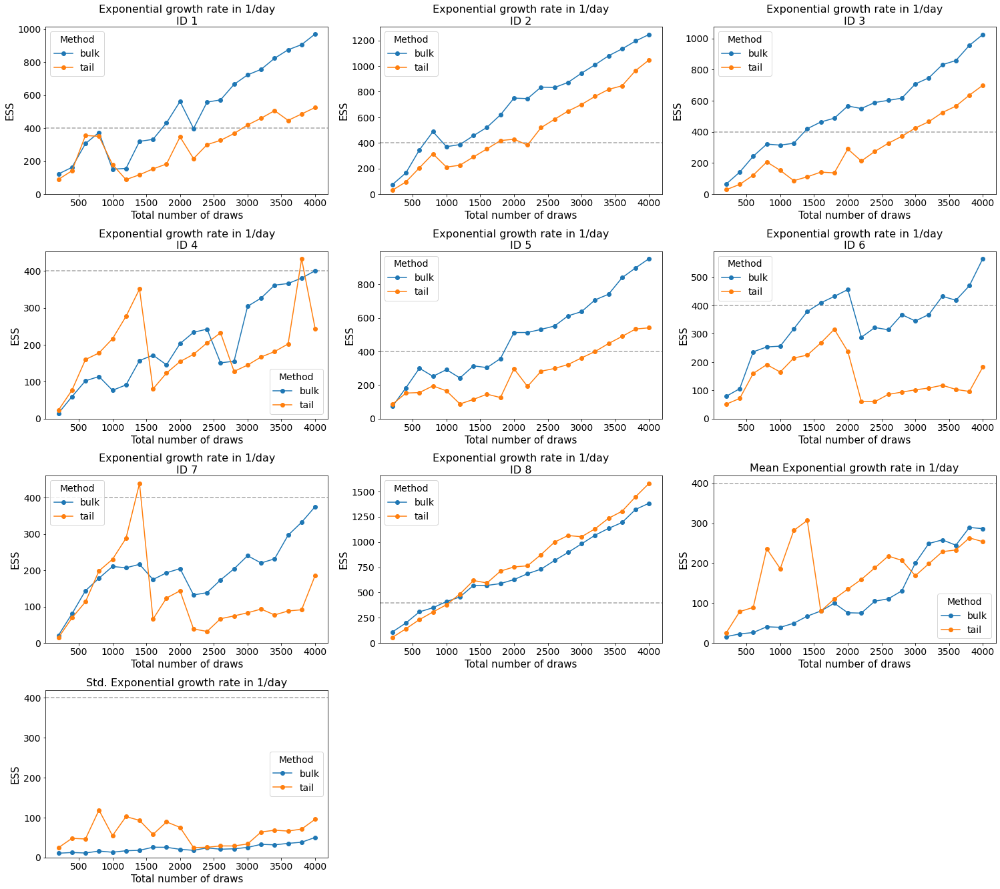

In [37]:
az.plot_ess(posterior_samples.sel(draw=slice(warmup, n_iterations)), kind="evolution")
plt.show()

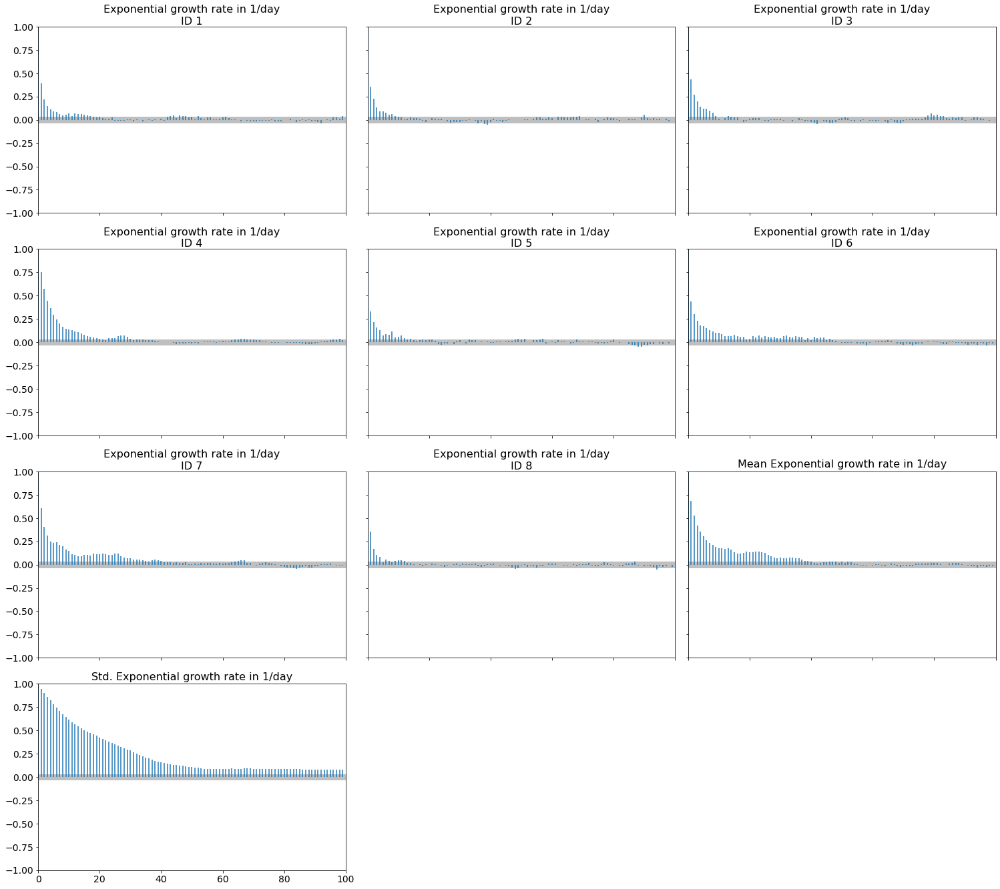

In [38]:
az.plot_autocorr(posterior_samples.sel(draw=slice(warmup, n_iterations)), combined=True)
plt.show()

### Reduce correlations by thinning out

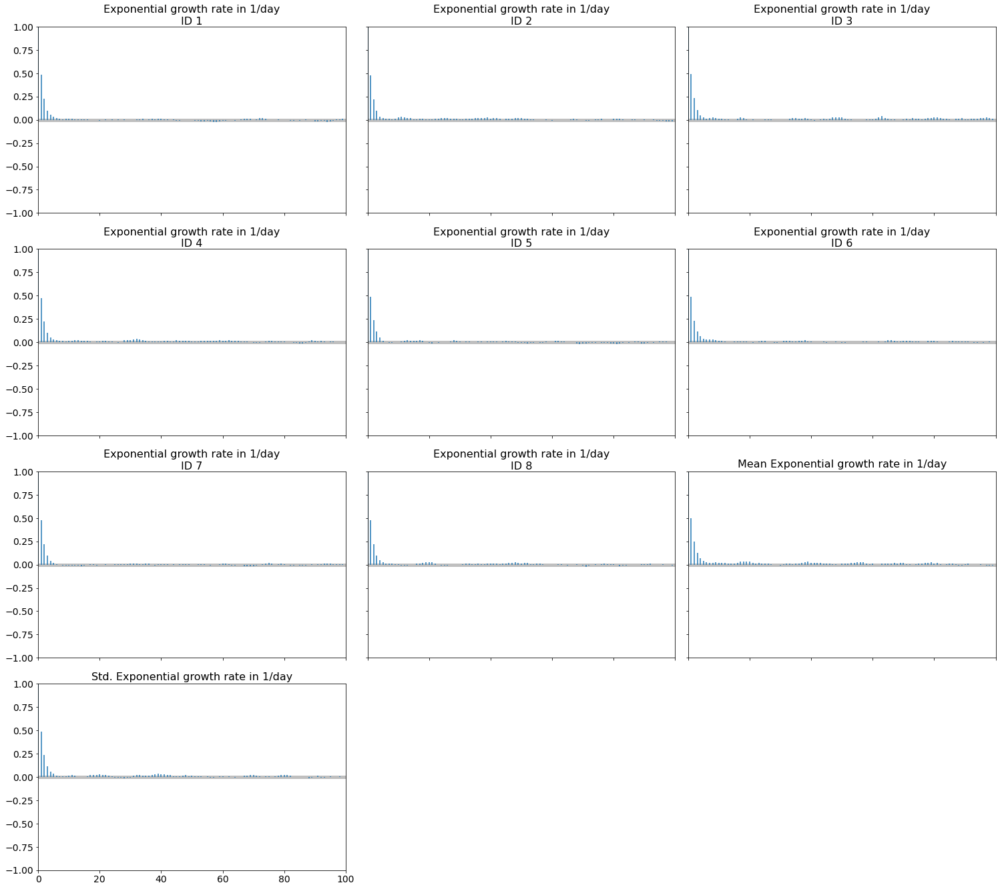

In [25]:
thinning_ratio = 10

az.plot_autocorr(posterior_samples.sel(draw=slice(warmup, n_iterations, thinning_ratio)), combined=True)
plt.show()

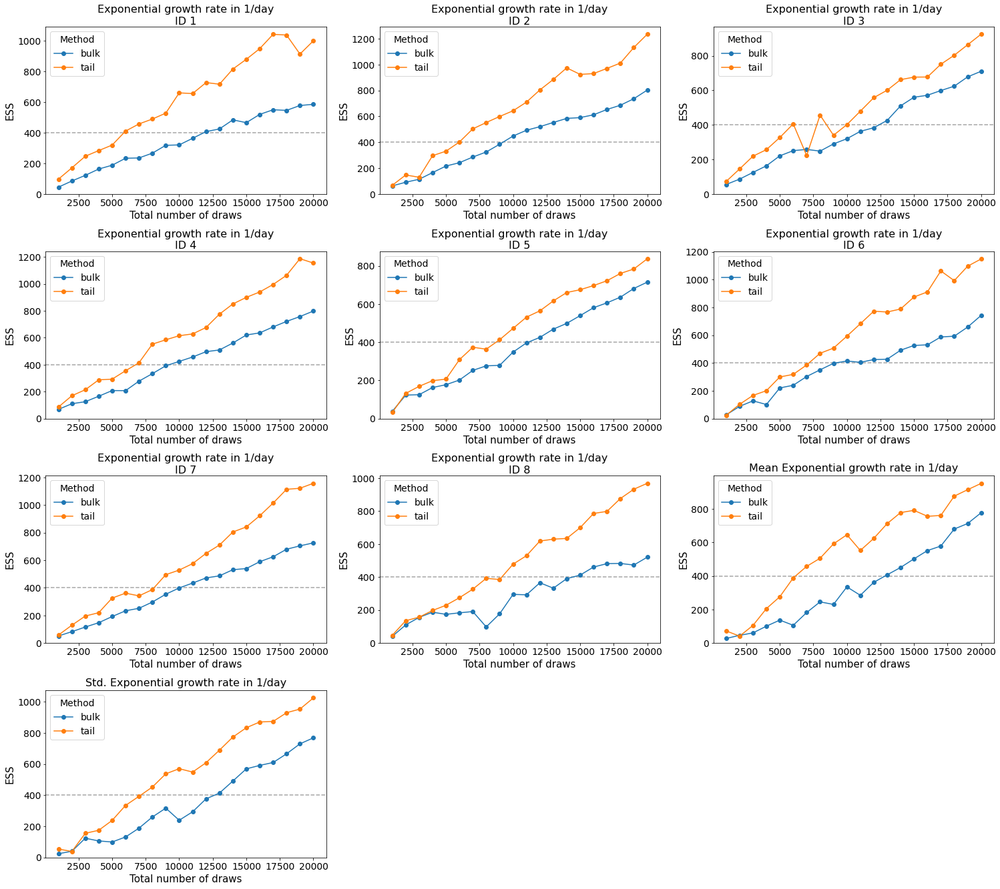

In [26]:
az.plot_ess(posterior_samples.sel(draw=slice(warmup, n_iterations, thinning_ratio)), kind="evolution")
plt.show()

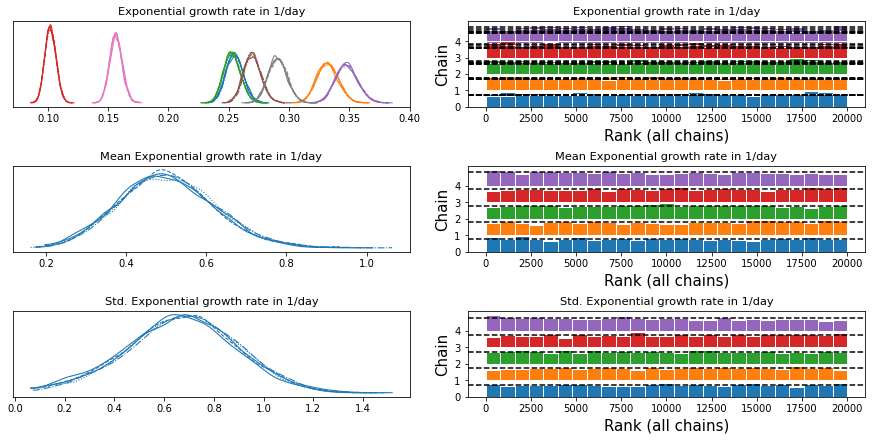

In [27]:
az.plot_trace(posterior_samples.sel(draw=slice(warmup, n_iterations, thinning_ratio)), kind='rank_bars')
plt.show()

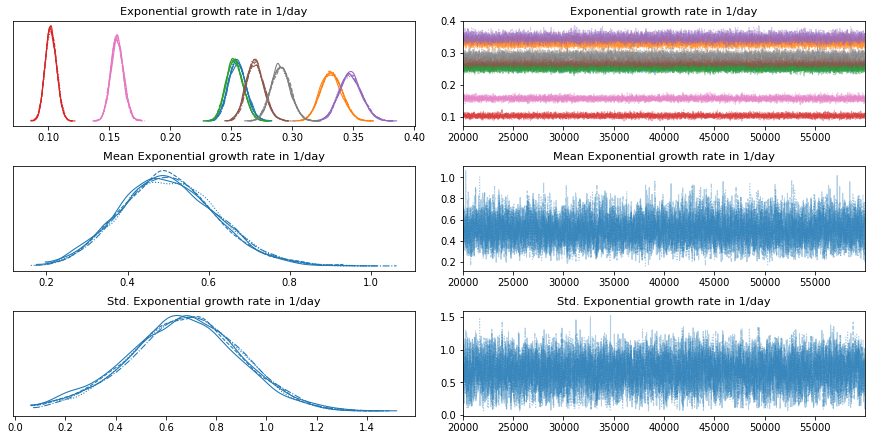

In [28]:
az.plot_trace(posterior_samples.sel(draw=slice(warmup, n_iterations, thinning_ratio)))
plt.show()

## Safe posterior

In [34]:
import os

# Rename parameters (for export)
temp = posterior_samples.rename({
    'Exponential growth rate in 1/day': 'growth_rate',
    'Mean Exponential growth rate in 1/day': 'mean_growth_rate',
    'Std. Exponential growth rate in 1/day': 'std_growth_rate'})
temp.attrs['fixed parameters'] = [
    'Tumour volume in cm^3',
    'Critical volume in cm^3',
    'Drug concentration in mg/L',
    'Potency in L/mg/day',
    'Sigma base',
    'Sigma rel.']
temp.attrs['fixed values'] = [
    0.13,
    1,
    0,
    0,
    0.04,
    0.1]
temp.attrs['divergent iterations'] = 'none'

# Export samples
directory = os.getcwd()
name = '/posteriors/all_fixed_but_growth_rate_acmc.nc'
temp.sel(draw=slice(warmup, n_iterations, thinning_ratio)).to_netcdf(directory + name)

## Zoom in to convergence step

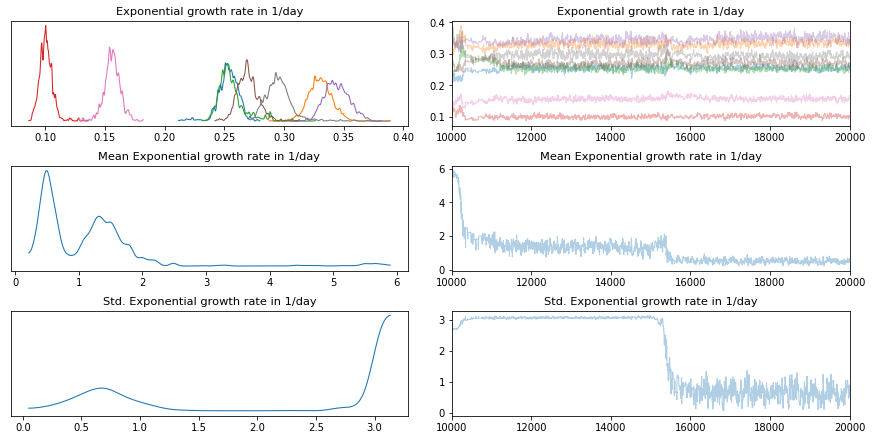

In [37]:
az.plot_trace(posterior_samples.sel(draw=slice(10000, 20000), chain=[1]))
plt.show()

Looks like cusp structure: The sampler has only a slim window of mean and std values which lead to higher scores. ACMC has a hard time to find it, but once it's found it quickly converges.

### Visually check that mean of 0.5 and std of 0.6 makes sense

array([[<AxesSubplot:title={'center':'x'}>]], dtype=object)

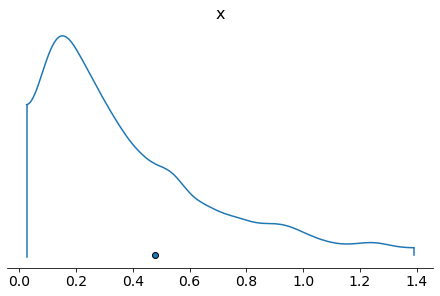

In [38]:
pop_model = erlo.LogNormalModel()
samples = pop_model.sample(parameters=[0.5, 0.6], n_samples=1000)

az.plot_density(samples)